### Load dataset and extract SentenceTransformers embeddings and prompt categories

In [28]:
import pandas as pd
from collections import Counter

INPUT_FILE = "data/processed/malignant_paraphrase_embedding.csv"
df = pd.read_csv(INPUT_FILE)

embeddings = []
for embedding in df['embedding']:
    temp = [float(x.strip(' []')) for x in embedding.split(',')]
    embeddings.append(temp)

categories = []
for category in df['category']:
    categories.append(category)

texts = []
for text in df['text']:
    texts.append(text)

print("Vector size:\t\t\t", len(embeddings[0]))
print("Number of embeddings:\t\t", len(embeddings))
print("Number of category entries:\t", len(categories))
print("Number of text entries:\t", len(texts))
category_count = Counter(categories)

for item, count in category_count.items():
    print(f'\t{item}: {count}')

Vector size:			 384
Number of embeddings:		 1581
Number of category entries:	 1581
Number of text entries:	 1581
	conversation: 1312
	jailbreak: 199
	act_as: 70


### Create dictionary mapping each embedding to a unique category value

In [29]:
def get_data_dict(data, labels, verbose=False):
    data_dict = {}

    for i, data_row in enumerate(data):
        label = labels[i]

        if label not in data_dict:
            data_dict[label] = []
        
        data_dict[label].append(data_row)

    data_dict = {k: v for k, v in data_dict.items() if len(v) > 1}

    if verbose:
        for key, value in list(data_dict.items())[:3]:
            print(f"{key}: {value[:2]}")
        print(len(data_dict['conversation']))
        print(len(data_dict['jailbreak']))
        print(len(data_dict['act_as']))

    return data_dict

In [30]:
get_data_dict(embeddings, categories, verbose=True)

conversation: [[0.6487895, -0.17706214, 0.26846254, 0.18905391, -0.3372622, -0.33025223, 0.19196248, 0.31563908, -0.29508653, 0.095583044, 0.08327556, -0.3019296, -0.1834357, -0.030582355, 0.083548054, 0.025754372, -0.093575306, -0.4416129, -0.6328432, -0.12889695, -0.6578927, -0.11932872, -0.37380874, -0.08648224, 0.4625755, 0.12580432, 0.009837387, 0.32809603, -0.38458908, -0.35081074, -0.0006224207, -0.13784581, 0.32487366, 0.07625004, 0.005976639, 0.5497536, 0.03989021, -0.23408373, -0.0031184023, 0.020262437, 0.0813289, -0.26453623, 0.14290124, 0.16723657, 0.24232718, -0.17889972, -0.07034221, 0.057655625, 0.19784576, -0.13899812, -0.15193778, 0.04306589, -0.10705217, 0.08456968, 0.12276527, 0.16948316, 0.05865023, 0.23994261, 0.2758895, -0.08349037, 0.2408557, 0.0716537, -0.44180578, 0.40890244, -0.26930577, -0.050254002, -0.15138207, -0.10073241, -0.08996335, -0.17056972, -0.04432253, -0.052577734, -0.3009628, 0.3951912, 0.013270948, -0.19769244, 0.17788011, -0.051462125, 0.1766

{'conversation': [[0.6487895,
   -0.17706214,
   0.26846254,
   0.18905391,
   -0.3372622,
   -0.33025223,
   0.19196248,
   0.31563908,
   -0.29508653,
   0.095583044,
   0.08327556,
   -0.3019296,
   -0.1834357,
   -0.030582355,
   0.083548054,
   0.025754372,
   -0.093575306,
   -0.4416129,
   -0.6328432,
   -0.12889695,
   -0.6578927,
   -0.11932872,
   -0.37380874,
   -0.08648224,
   0.4625755,
   0.12580432,
   0.009837387,
   0.32809603,
   -0.38458908,
   -0.35081074,
   -0.0006224207,
   -0.13784581,
   0.32487366,
   0.07625004,
   0.005976639,
   0.5497536,
   0.03989021,
   -0.23408373,
   -0.0031184023,
   0.020262437,
   0.0813289,
   -0.26453623,
   0.14290124,
   0.16723657,
   0.24232718,
   -0.17889972,
   -0.07034221,
   0.057655625,
   0.19784576,
   -0.13899812,
   -0.15193778,
   0.04306589,
   -0.10705217,
   0.08456968,
   0.12276527,
   0.16948316,
   0.05865023,
   0.23994261,
   0.2758895,
   -0.08349037,
   0.2408557,
   0.0716537,
   -0.44180578,
   0.40890

Demonstrate dictionary structure



### Load data for triplet loss

In [31]:
from triplet_dataset import TripletDataset
import torch
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from collections import Counter

test_size = 0.3
random_state = 42


x_train, x_test, y_train, y_test = train_test_split(embeddings, categories, test_size=test_size, stratify=categories, random_state=random_state)
data_dict_train = get_data_dict(x_train, y_train, verbose=True)


print(len(x_train), len(x_test), len(x_train) + len(x_test))
print(len(y_train), len(y_test), len(y_train) + len(y_test))

print(Counter(categories))
print(Counter(y_train))
print(Counter(y_test))


siamese_dataset_train = TripletDataset(data_dict_train, False)

# Load the training dataset
num_workers = 4
batch_size = 1800
train_dataloader = DataLoader(
    siamese_dataset_train, shuffle=True, num_workers=num_workers, batch_size=batch_size
)



jailbreak: [[0.120440826, -0.14530861, 0.12001089, 0.056998838, -0.11146735, -0.011041276, -0.09429769, -0.04344923, -0.33611983, 0.14181666, 0.06611264, 0.15643758, -0.031475473, -0.22890054, 0.34380436, -0.026235037, 0.05332911, 0.15481968, 0.004469035, 0.12255222, 0.18520513, 0.00030092744, 0.08542007, 0.10792415, -0.2504825, 0.06900083, -0.026997386, 0.028969714, -0.041007828, -0.29255658, 0.05996898, 0.36599606, -0.015693355, -0.11796893, -0.11132034, 0.07831508, -0.05157482, -0.052607972, -0.32180178, -0.2646377, -0.12638746, 0.084922, -0.0037783948, -0.07567134, -0.26319376, -0.06894309, -0.15749179, -0.085327916, -0.11973514, -0.09351798, 0.050077364, -0.25211442, -0.05611668, -0.118867904, 0.03405998, 0.010869378, 0.1646919, 0.33085638, 0.0013073467, -0.077394545, -0.004846316, -0.3050005, -0.1514746, 0.21596153, -0.049805615, 0.065285735, 0.012649497, -0.09857398, 0.18604249, -0.031998146, -0.30235606, 0.012667543, 0.12206284, -0.12668608, 0.15627044, -0.106836334, -0.0429903

In [32]:
import pandas as pd

def create_dataset(embeddings, categories):
    df = pd.DataFrame({'embedding': embeddings, 'category': categories})
    return df

def create_and_save_dataset(embeddings, categories, dataset_name, to_csv=True, to_pickle=False):
    df = create_dataset(embeddings, categories)
    if to_csv:
        df.to_csv(f"data/processed/{dataset_name}.csv", index=False)
    if to_pickle:
        df.to_pickle(f"data/processed/{dataset_name}.pkl")
    return df

print(create_and_save_dataset(x_train, y_train, "malignant_split_train", to_pickle=True))
print(create_and_save_dataset(x_test, y_test, "malignant_split_test", to_pickle=True))

                                              embedding      category
0     [0.120440826, -0.14530861, 0.12001089, 0.05699...     jailbreak
1     [0.3427307, 0.48883456, 0.0076719304, 0.032561...  conversation
2     [0.43551326, -0.15476719, 0.15530626, 0.026289...  conversation
3     [-0.057137176, 0.3647197, 0.13576935, -0.04810...     jailbreak
4     [0.06655428, -0.026689064, 0.27394968, 0.12793...        act_as
...                                                 ...           ...
1101  [0.08036787, 0.09728212, 0.10380996, -0.105494...  conversation
1102  [-0.045208458, -0.0766216, -0.06379559, -0.213...     jailbreak
1103  [-0.06478809, -0.17711227, -0.038477726, -0.05...        act_as
1104  [0.017201927, 0.13068205, -0.23231721, 0.06582...  conversation
1105  [0.03301016, -0.59459823, 0.27325213, 0.203545...  conversation

[1106 rows x 2 columns]
                                             embedding      category
0    [0.21302252, -0.45752683, 0.09543563, 0.219165...  conversati

### Initialize siamese network

In [33]:
from torch import optim
import torch.nn as nn

from siamese_network import SiameseNetwork

embedding_dim = 128

siamese_net = SiameseNetwork(embedding_dim).cuda()
margin = 0.3
criterion = nn.TripletMarginLoss(margin=margin)

learning_rate = 0.0001
optimizer = optim.Adam(siamese_net.parameters(), lr=learning_rate)

n_epochs = 200

print(siamese_net)
print(f"Number of epochs: {n_epochs}")
print(f"Embedding dimension: {embedding_dim}")
print(f"Optimizer: Adam")
print(f"Learning rate: {learning_rate}")
print(f"Loss function: TripletMarginLoss")
print(f"Margin: {margin}")
print(f"Batch size: {batch_size}")
print(f"Number of workers: {num_workers}")
print(f"Dataset: {INPUT_FILE}")
print(f"Number of classes: {3}")
print(f"Number of samples: {len(siamese_dataset_train)}")

print()

SiameseNetwork(
  (embedding): Sequential(
    (0): Linear(in_features=384, out_features=512, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=512, out_features=256, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=256, out_features=128, bias=True)
  )
)
Number of epochs: 200
Embedding dimension: 128
Optimizer: Adam
Learning rate: 0.0001
Loss function: TripletMarginLoss
Margin: 0.3
Batch size: 1800
Number of workers: 4
Dataset: data/processed/malignant_paraphrase_embedding.csv
Number of classes: 3
Number of samples: 1106



In [34]:
def train(n_epochs, model, optimizer, criterion):
    global train_dataloader
    best_loss = float("inf")
    best_state = None
    iteration_number = 0
    counter = []
    loss_history = []

    for epoch in range(n_epochs):
        # Iterate over batches
        for i, (anchor, positive, negative) in enumerate(train_dataloader, 0):
            # Send the images to CUDA
            anchor, positive, negative = anchor.cuda(), positive.cuda(), negative.cuda()

            # Zero the gradients
            optimizer.zero_grad()

            # Pass in the anchor, positive, and negative images into the network
            output_anchor, output_positive, output_negative = model(anchor, positive, negative)

            # Compute the triplet loss
            loss_triplet = criterion(output_anchor, output_positive, output_negative)

            # If the validation loss is at a minimum
            if loss_triplet < best_loss:
                best_loss = loss_triplet
                best_state = model.state_dict()

            # Backpropagation
            loss_triplet.backward()

            # Optimize
            optimizer.step()

            # Every 10 batches print out the loss
            if i % 10 == 0:
                print(f"Epoch number {epoch}\n Current loss {loss_triplet.item()}\n")
                iteration_number += 10

                counter.append(iteration_number)
                loss_history.append(loss_triplet.item())

    print("Training finished")
    # print(counter)
    # print(loss_history)
    return counter, loss_history, best_state, best_loss

In [35]:
import matplotlib.pyplot as plt

def show_plot(iteration, loss):
    plt.plot(iteration, loss)
    plt.show()

### Train siamese network and log metrics

In [36]:
%%time
import time
from datetime import datetime

start_time = time.time()
# Training
counter, loss_history, best_state, best_loss = train(n_epochs, siamese_net, optimizer, criterion)
end_time = time.time()
execution_time = end_time - start_time

minutes, seconds = divmod(execution_time, 60)

Epoch number 0
 Current loss 0.2834460139274597

Epoch number 1
 Current loss 0.2785453796386719

Epoch number 2
 Current loss 0.27214738726615906

Epoch number 3
 Current loss 0.26319897174835205

Epoch number 4
 Current loss 0.25439703464508057

Epoch number 5
 Current loss 0.24626930058002472

Epoch number 6
 Current loss 0.23499393463134766

Epoch number 7
 Current loss 0.22185203433036804

Epoch number 8
 Current loss 0.21130810678005219

Epoch number 9
 Current loss 0.19489786028862

Epoch number 10
 Current loss 0.1839006245136261

Epoch number 11
 Current loss 0.1690586805343628

Epoch number 12
 Current loss 0.149524986743927

Epoch number 13
 Current loss 0.13284334540367126

Epoch number 14
 Current loss 0.11552270501852036

Epoch number 15
 Current loss 0.10694943368434906

Epoch number 16
 Current loss 0.09404046833515167

Epoch number 17
 Current loss 0.08555784821510315

Epoch number 18
 Current loss 0.07316088676452637

Epoch number 19
 Current loss 0.06357605010271072


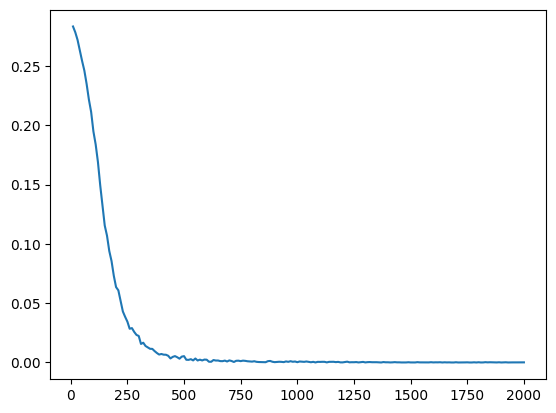

In [37]:
show_plot(counter, loss_history)

In [38]:
print(best_loss)

tensor(0., device='cuda:0', grad_fn=<MeanBackward0>)


### Save model

In [39]:
from datetime import datetime
import os
import torch

now = datetime.now().strftime("%d-%m-%Y_%H-%M-%S")

# create folder
model_dir = f"trained_split_paraphrase/{now}"
os.makedirs(model_dir, exist_ok=True)
# Save the trained model
torch.save(siamese_net.state_dict(), os.path.join(model_dir, "state.pth"))

# Save the best state
torch.save(best_state, os.path.join(model_dir, f"best_state-{best_loss}.pth"))

torch.save(siamese_net, os.path.join(model_dir, "model.pth"))
with open(os.path.join(model_dir, "Architecture.txt"), "w") as f:
    f.write(str(siamese_net))
    f.write(f"\nExecution time: {int(minutes)} minutes and {seconds:.2f} seconds\n")
    f.write(f"Number of epochs: {n_epochs}\n")
    f.write(f"Embedding dimension: {embedding_dim}\n")
    f.write(f"Optimizer: Adam\n")
    f.write(f"Learning rate: {learning_rate}\n")
    f.write(f"Loss function: TripletMarginLoss\n")
    f.write(f"Margin: {margin}\n")
    f.write(f"Batch size: {batch_size}\n")
    f.write(f"Number of workers: {num_workers}\n")
    f.write(f"Dataset: {INPUT_FILE}\n")
    f.write(f"Number of classes: {len(data_dict_train)}\n")
    f.write(f"Number of samples: {len(siamese_dataset_train)}\n")
    f.write(f"Test size: {test_size}\n")
    f.write(f"Data split seed: {random_state}\n")

In [40]:
import torch

malicious_model = torch.load(os.path.join(model_dir, "model.pth"))

### Evaluate best threshold and AUC

In [41]:
import importlib
import roc_curve
importlib.reload(roc_curve)

fpr, tpr, roc_auc, best_threshold = roc_curve.main(malicious_model, plot=True, folder=model_dir)
print(f"Best threshold: {best_threshold}")
print(f"AUC: {roc_auc}")

Vector size:			 384
Number of embeddings:		 1496
Number of category entries:	 1496
Best threshold: 1.054781754621597
AUC: 0.998731
